## MIIA-4203 MODELOS AVANZADOS PARA ANÁLISIS DE DATOS II


# Aprendizaje por transferencia con redes neuronales 


### Profesor: Camilo Franco (c.franco31@uniandes.edu.co)

En este cuadernos estudiaremos una implementación de aprendizaje por transferencia utilizando la red pre-entrenada VGG-16. Implementaremos nuestra propio modelo de aprendizaje por trasferencia utilizando la biblioteca (API) Keras (https://keras.io/). 

Finalmente evaluaremos si un modelo más complejo de *deep learning* nos permite lograr un mejor desempeño para la detección automática de frailejones sobre imagenes aereas del páramo.

Primero importemos algunos de los paquetes que vamos a utilizar, junto con las imagenes de entrenamiento:


In [122]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

from ImportImagenesRGB import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix 

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from prettytable import PrettyTable
import datetime

import keras
from keras.models import Sequential, load_model
from keras.optimizers import SGD
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense
from keras import applications

from numpy.random import seed
seed(1)
import tensorflow
tensorflow.random.set_seed(1)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [123]:
X,Y = import_imagenes_RGB()

print(X.shape, Y.shape, X[0,0,0])

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


**Salida esperada:**

(250, 70, 70, 3) (1, 250) [0.58823529 0.5372549  0.40392157]


## 1. Aprendizaje por transferencia

En pocas palabras, el aprendizaje por transferencia tiene su historia en la psicología, refiriendose a situaciones donde las personas aplican conocimiento, estrategias y aptitudes que han aprendido previamente para enfrentar una nueva situación bajo un contexto **relacionado**. Dentro del aprendizaje computacional, este tipo de aprendizaje se enfoca en guardar un tipo de conocimiento que ya se ha mostrado útil para resolver un problema, y aplicarlo para resolver otro problema distinto pero **relacionado**.

Hay que tener en cuenta que si un modelo de transferencia tiene un efecto negativo sobre el desempeño del modelo, entonces tendremos una transferencia negativa (lo cual no es deseable). De este modo, el reto de los métodos de transferencia es el de producir una transferencia positiva entre tareas apropiadamente relacionadas, evitando transferencias negativas entre tareas poco relacionadas (ver Torrey & Shavlik (2009) Transfer learning). 

El ejemplo que vamos a ver a continuación es un tipo de aprendizaje por transferencia inductivo, característico de las redes neuronales, el cual se ajusta de acuerdo con la coincidencia de un conocimiento previo sobre la fuente de información y la tarea que se propone solucionar. En particular, vamos a llevar a cabo un *aprendizaje por transferencia inductivo-jerárquico*, buscando soluciones a tareas sencillas mediante la combinación de herramientas desarrolladas para tareas más complejas. Entonces, usamos el aprendizaje de una red pre-entrenada, la VGG-16, para aprovechar su conocimiento sobre formas, contornos, bordes, etc. que podemos hacer propias para terminar de entender mejor el problema de clasificación de frailejones, y esperamos mejorar el desempeño de los modelos.


### VGG-16

La red VGG-16 fue propuesta por Simonyan & Zisserman (2015) en Very deep CNN for large-scale image recognition, siguiendo los principios presentados en Ciresan et al. (2011): Flexible, High Performance Convolutional Neural Networks for Image Classification.

La arquitectura de la VGG-16 le permitió ganar la competición ILSVR(Imagenet) 2014 (http://www.image-net.org/challenges/LSVRC/2014/results). Los principios de esta arquitectura consisten en considerar filtros convolucionales pequeños (de $3\times 3$), que recorren las imagenes exhaustivamente, con un *stride* de 1, y capas de *max-poling* de $2\times 2$, reduciendo en gran medida el número de hiper-parámetros a optimizar. La red VGG-16 es bastante profunda, con una configuración de 16 capas (con aprox. 138 millones de parámetros): para las primeras 14 capas combina capas convolucionales y capas de agregación, y al final tiene 2 capa densamente conectadas seguidas de una capa de salida *softmax* para clasificación de múltiples clases (ver: https://neurohive.io/en/popular-networks/vgg16/).


Implementemos nuestro ejemplo de aprendizaje por transferencia utilizando la red VGG-16, la cual ha sido entrenada previamente con imagenes RGB y que podemos descargar directamente de Keras:

In [124]:
model0   = applications.VGG16(include_top=False, weights='imagenet')
config_transI = model0.get_config()

Pasamos nuestro conjunto de datos por la red, obteniendo los nuevos patrones de acuerdo con el entendimiento de la red convolucional VGG-16 acerca de las nociones más básicas que encuentra en nuestras imagenes del Páramo:

In [125]:
feat_X = model0.predict(X)

In [126]:
np.shape(feat_X)

(250, 2, 2, 512)

In [127]:
#Summary of Xception Model
print(model0.summary())

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

Agregamos unas pocas capas finales para afinar el modelo por transferencia para la tarea específica de detección de imagenes aereas del Páramo:

In [59]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

Y entrenamos esas capas finales:

In [60]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_partseed='+str(r)+'.tf')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

INFO:tensorflow:Assets written to: Transfer_Adam_partseed=3.tf\assets
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
INFO:tensorflow:Assets written to: Transfer_Adam_partseed=1.tf\assets
Epoca= 99 , accu_v1=1.0 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   | 0.973  | 0.9211 |   99  |
|  1.0   |  1.0   | 0.9737 |   99  |
+--------+--------+--------+-------+


Graficamos el desempeño del modelo:

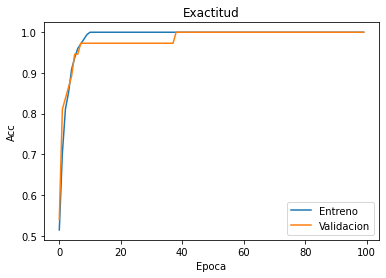

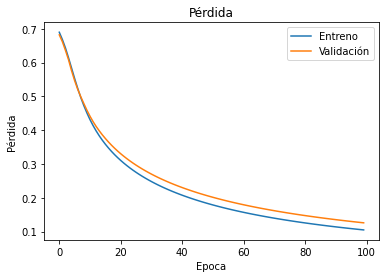

In [61]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

Cargamos el mejor modelo y confirmamos el desempeño del modelo sobre todo el conjunto de datos:

In [62]:
# red convolucional
model_4 = load_model('Transfer_Adam_partseed=1.h5')

model_4.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 5)                 10245     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 6         
Total params: 10,251
Trainable params: 10,251
Non-trainable params: 0
_________________________________________________________________


Veamos el desempeño del mejor modelo sobre todo el conjunto de datos:

In [63]:
Y_pred = model_4.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[144,   1],
       [  0, 105]], dtype=int64)

**Salida esperada:**
    
<table style="width:20%">
    <tr>
       <td> 144 </td>
       <td> 1 </td>
    </tr>
    <tr>
       <td> 0 </td>
       <td> 105 </td>
    </tr>

</table>

In [64]:
np.size(Y.T)

250

In [65]:
np.size(Y_preds)

250

Podemos observar que el desempeño del modelo a mejorado bastante. 

### Ejercicio 1.1

Encuentre el mejor modelo examinando una configuración distinta para las capas de salida, o siguiendo alguna otra estrategia como puede ser cambiando el optimizador o las funciones de activación.

### 1.1.1 Cambio de Optimizador

In [12]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Optimizer","Exac_E", "Exac_V", "Exac_P", "Epoca"])

optimizers = ["SGD", "RMSprop", "Adam"]

for opt in optimizers:
    
    # Definimos el número máximo de iteraciones (épocas de la red)
    epocas=100

    # Definimos el optimizador
    if opt=="SGD":
        opti = sgd = SGD(lr=0.01, momentum=0.001)
    if opt=="RMSprop":
        opti = keras.optimizers.RMSprop(lr=0.000008, rho=0.9)
    if opt=="Adam":
        opti = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)
    
    # Inicializamos el error 
    err_p = 999

    for i in range(0,3,1):
        r = i^3
        CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
        CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)

        # Definimos la arquitectura de la red
        model = Sequential.from_config(config_transF)

        # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
        model.compile(loss='binary_crossentropy', optimizer=opti, metrics=['accuracy'])

        # Ajustamos el modelo
        history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

        # Encontramos el mejor modelo en validación
        min_err=np.min(history.history['val_loss'])
        best_epoc=np.where(history.history['val_loss'] == min_err)[0] 

        # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
        model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

        # Calculamos las metricas
        train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
        valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
        test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)

        # Guardamos las métricas de desempeño
        accu_e = train_metrics[1]
        loss_e = train_metrics[0]
        accu_v = valid_metrics[1]
        loss_v = valid_metrics[0]
        accu_p = test_metrics[1]
        loss_p = test_metrics[0]

        if (loss_p < err_p):
            pathr =('Transfer_'+str(opt)+'_partseed='+str(r)+'.tf')
            model.save(pathr) 
            err_p = loss_p

        # Imprimimos el desempeño para cada repetición
        print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

        x.add_row([opt,np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

INFO:tensorflow:Assets written to: Transfer_SGD_partseed=3.tf\assets
Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 0 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
INFO:tensorflow:Assets written to: Transfer_SGD_partseed=1.tf\assets
Epoca= 99 , accu_v1=0.7027027010917664 , accu_v2=0.8684210777282715
INFO:tensorflow:Assets written to: Transfer_RMSprop_partseed=3.tf\assets
Epoca= 0 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
INFO:tensorflow:Assets written to: Transfer_RMSprop_partseed=2.tf\assets
Epoca= 99 , accu_v1=0.4864864945411682 , accu_v2=0.6052631735801697
INFO:tensorflow:Assets written to: Transfer_RMSprop_partseed=1.tf\assets
Epoca= 99 , accu_v1=0.5405405163764954 , accu_v2=0.5789473652839661
INFO:tensorflow:Assets written to: Transfer_Adam_partseed=3.tf\assets
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 99 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
INFO:tensorflow:Assets written

### 1.1.2 Cambio de Parametros de Aprendizaje

In [18]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["lr","b_1,", "b_2","Exac_E", "Exac_V", "Exac_P", "Epoca"])

l_rate = [0.1, 0.01, 0.001]
b_1 = [0.9,0.09,0.009]
b_2 = [0.9,0.09,0.009]

err_best = 999
epoch_best = 999

for lr in l_rate:
    epoch_best = 999
    for b_uno in b_1:
        epoch_best = 999
        for b_dos in b_2:
            epoch_best = 999
                        
            # Definimos el número máximo de iteraciones (épocas de la red)
            epocas=100

            opti = keras.optimizers.Adam(lr=lr, beta_1=b_uno, beta_2=b_dos)
    
            # Inicializamos el error 

            for i in range(0,3,1):
                r = i^3
                CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
                CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)

                # Definimos la arquitectura de la red
                model = Sequential.from_config(config_transF)

                # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
                model.compile(loss='binary_crossentropy', optimizer=opti, metrics=['accuracy'])

                # Ajustamos el modelo
                history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

                # Encontramos el mejor modelo en validación
                min_err=np.min(history.history['val_loss'])
                best_epoc=np.where(history.history['val_loss'] == min_err)[0] 

                # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
                model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

                # Calculamos las metricas
                train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
                valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
                test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)

                # Guardamos las métricas de desempeño
                accu_e = train_metrics[1]
                loss_e = train_metrics[0]
                accu_v = valid_metrics[1]
                loss_v = valid_metrics[0]
                accu_p = test_metrics[1]
                loss_p = test_metrics[0]               
                
                if ((loss_p <= err_best)):
                    if (best_epoc[0] < epoch_best):
                        print("\nSe guarda el mejor modelo con ls = " + str(loss_p)+
                              " y Ep=" + str(best_epoc[0])+
                              ' lr='+str(lr)+
                              ' b1='+str(b_uno)+
                              ' b2='+str(b_dos)
                             )
                        pathr =('Transfer_Adam_lr='+str(lr)+
                                '_b1='+str(b_uno)+
                                '_b2='+str(b_dos)+
                                '_partseed='+str(r)+'.tf')
                        model.save(pathr) 
                        err_best = loss_p
                        epoch_best = best_epoc[0]

                # Imprimimos el desempeño para cada repetición
                print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

                x.add_row([lr,b1,b2,np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)


Se guarda el mejor modelo con ls = 0.6715430617332458 y Ep=0 lr=0.1 b1=0.9 b2=0.9
INFO:tensorflow:Assets written to: Transfer_Adam_lr=0.1_b1=0.9_b2=0.9_partseed=3.tf\assets
Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 3 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 99 , accu_v1=1.0 , accu_v2=0.9736841917037964

Se guarda el mejor modelo con ls = 0.6711243391036987 y Ep=0 lr=0.1 b1=0.9 b2=0.09
INFO:tensorflow:Assets written to: Transfer_Adam_lr=0.1_b1=0.9_b2=0.09_partseed=3.tf\assets
Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 3 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 1 , accu_v1=0.5405405163764954 , accu_v2=0.6315789222717285
Epoca= 97 , accu_v1=0.5675675868988037 , accu_v2=0.3947368562221527
Epoca= 2 , accu_v1=0.45945945382118225 , accu_v2=0.6052631735801697
Epoca= 0 , accu_v1=0.5405405163764954 , accu_v2=0.6315789222717285
Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631

In [20]:
import pandas as pd
print(x[23])

+-----+------+-----+--------+--------+--------+-------+
|  lr | b_1, | b_2 | Exac_E | Exac_V | Exac_P | Epoca |
+-----+------+-----+--------+--------+--------+-------+
| 0.1 | 0.09 | 0.9 |  1.0   | 0.973  | 0.9737 |   30  |
+-----+------+-----+--------+--------+--------+-------+


Podemos observar una Exactitud en Prueba de 97% pero con menos epocas (30) con los siguentes parametros para el optimizador Adam:
* Learning Rate = 0.1
* Beta 1 = 0.09
* Beta 2 = 0.9

### 1.1.3 Cambio de Incializadores de la Red

In [22]:
# Inicializacion de He
initHe = keras.initializers.he_normal(seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(5, activation='relu', kernel_initializer=initHe, bias_initializer='zeros'))  
model.add(Dense(1, activation='sigmoid', kernel_initializer=initHe, bias_initializer='zeros')) 

config_transF = model.get_config()

# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.1, beta_1=0.009, beta_2=0.009)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_He_partseed='+str(r)+'.tf')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

INFO:tensorflow:Assets written to: Transfer_Adam_He_partseed=3.tf\assets
Epoca= 0 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 0 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
INFO:tensorflow:Assets written to: Transfer_Adam_He_partseed=1.tf\assets
Epoca= 0 , accu_v1=0.5405405163764954 , accu_v2=0.6315789222717285
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.6057 | 0.4324 | 0.6053 |   0   |
|  0.4   | 0.5405 | 0.3947 |   0   |
| 0.5771 | 0.5405 | 0.6316 |   0   |
+--------+--------+--------+-------+


### 1.1.4 Cambio de Arquitectura de la Red

In [23]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model = Sequential()  
model.add(Flatten(input_shape=feat_X.shape[1:]))  
model.add(Dense(100, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(10, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))
model.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF = model.get_config()

# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=100

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.1, beta_1=0.009, beta_2=0.009)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model = Sequential.from_config(config_transF)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Adam_Best_partseed='+str(r)+'.tf')
        model.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

INFO:tensorflow:Assets written to: Transfer_Adam_Best_partseed=3.tf\assets
Epoca= 36 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 3 , accu_v1=0.5405405163764954 , accu_v2=0.3947368562221527
INFO:tensorflow:Assets written to: Transfer_Adam_Best_partseed=1.tf\assets
Epoca= 25 , accu_v1=0.9729729890823364 , accu_v2=0.9736841917037964
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
| 0.6057 | 0.4324 | 0.6053 |   36  |
|  0.4   | 0.5405 | 0.3947 |   3   |
|  1.0   | 0.973  | 0.9737 |   25  |
+--------+--------+--------+-------+


Podemos observar que a medida que se añaden mas capas densas, la Exactitud no aumenta, pero disminuyen el numero de epocas, llegando a una convergencia acelerada.

## 2. Caso aplicado

Ahora probemos nuestro modelo sobre la imagen completa de prueba del paramo ``IMG_3451.JPG``.


In [24]:
import keras
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
# load the image
img = load_img('IMG_3451.jpg')
print(type(img))
# convert to numpy array
img_array = img_to_array(img)
print(img_array.dtype)
print(img_array.shape)
# convert back to image
img_pil = array_to_img(img_array)
print(type(img))

<class 'PIL.JpegImagePlugin.JpegImageFile'>
float32
(3000, 4000, 3)
<class 'PIL.JpegImagePlugin.JpegImageFile'>


### 2.1 Red sencilla

In [25]:
# red sencilla 5 neuronas
model_1 = load_model('modelo_redsencilla_initseed=1_part_seed=3numn=5.h5')

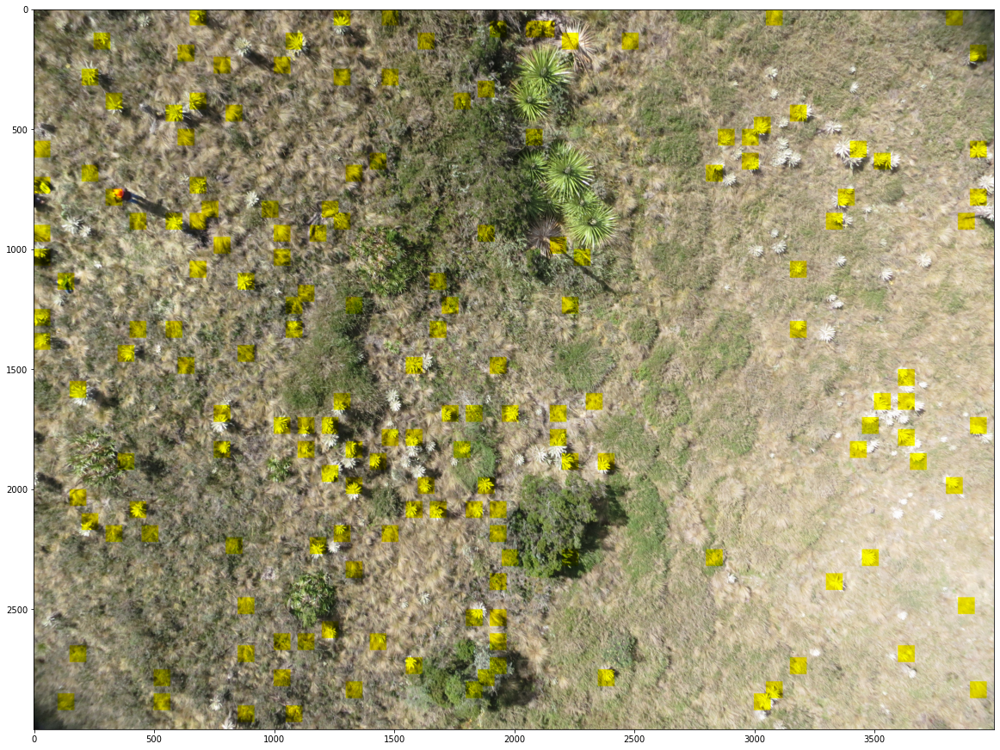

In [26]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_1.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.2 Red multi-capa

In [27]:
# red profunda de 6 capas]
model_2 = load_model('modelo_redprofunda_initseed=1_part_seed=8_Init=Normal.h5')

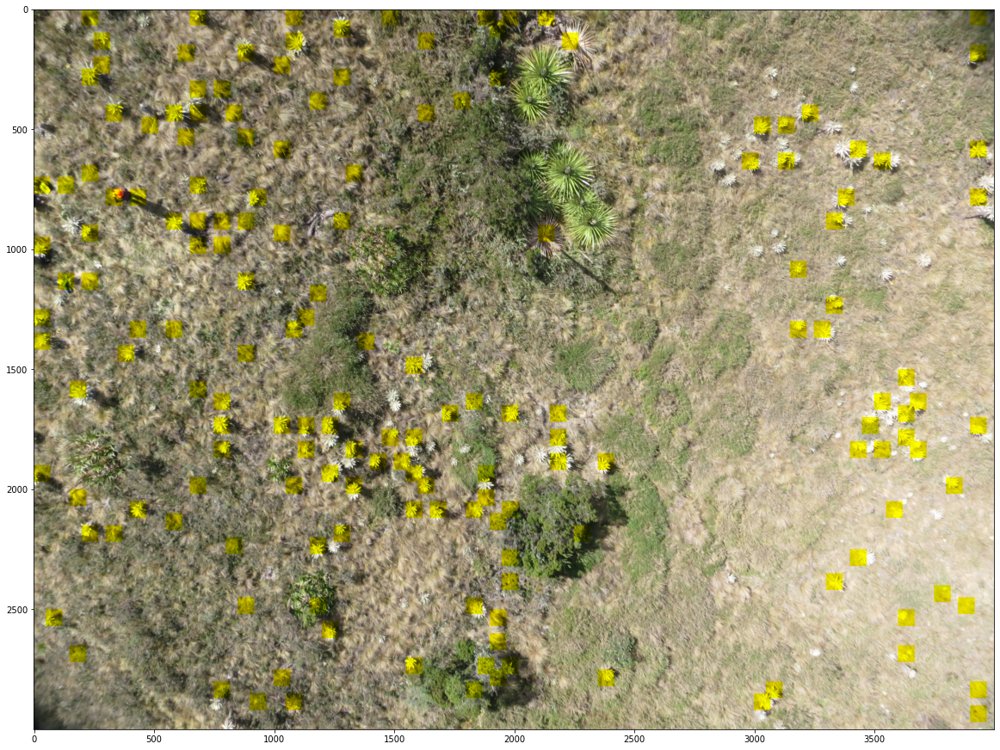

In [28]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_2.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.3 Red Convolucional

In [29]:
# red convolucional sencilla
model_3 = load_model('BM_CNN.tf')

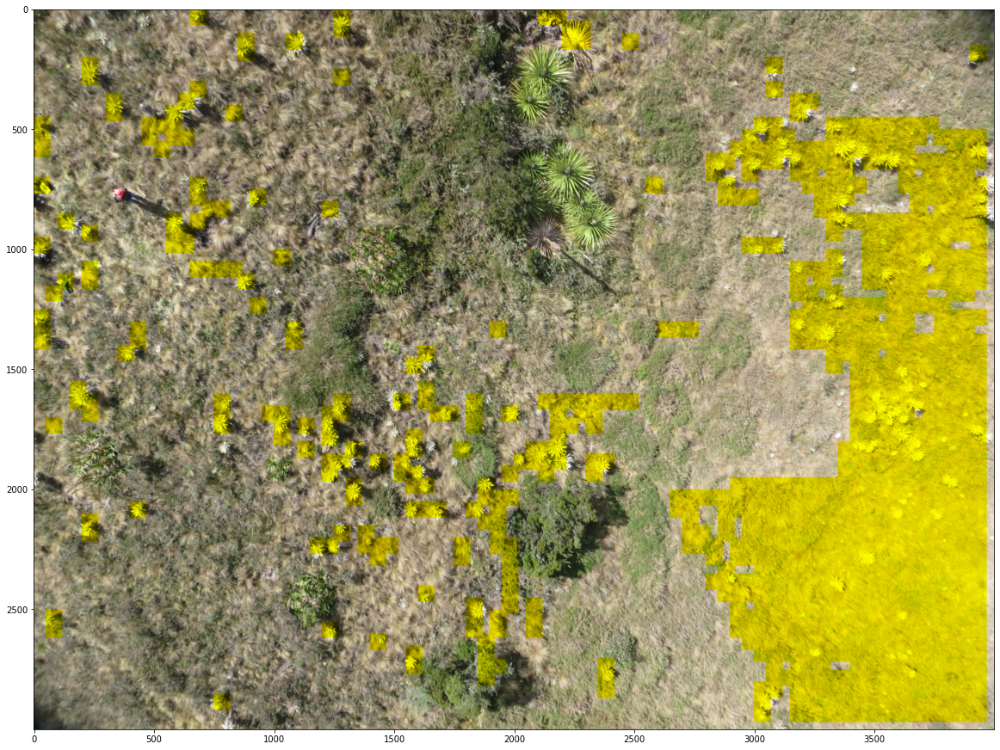

In [30]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        Y_preds = model_3.predict(subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### 2.4 Red Convolucional VGG-16 con transferencia

In [31]:
# red sencilla 5 neuronas
model_T = load_model('Transfer_Adam_lr=0.1_b1=0.09_b2=0.9_partseed=1.tf')

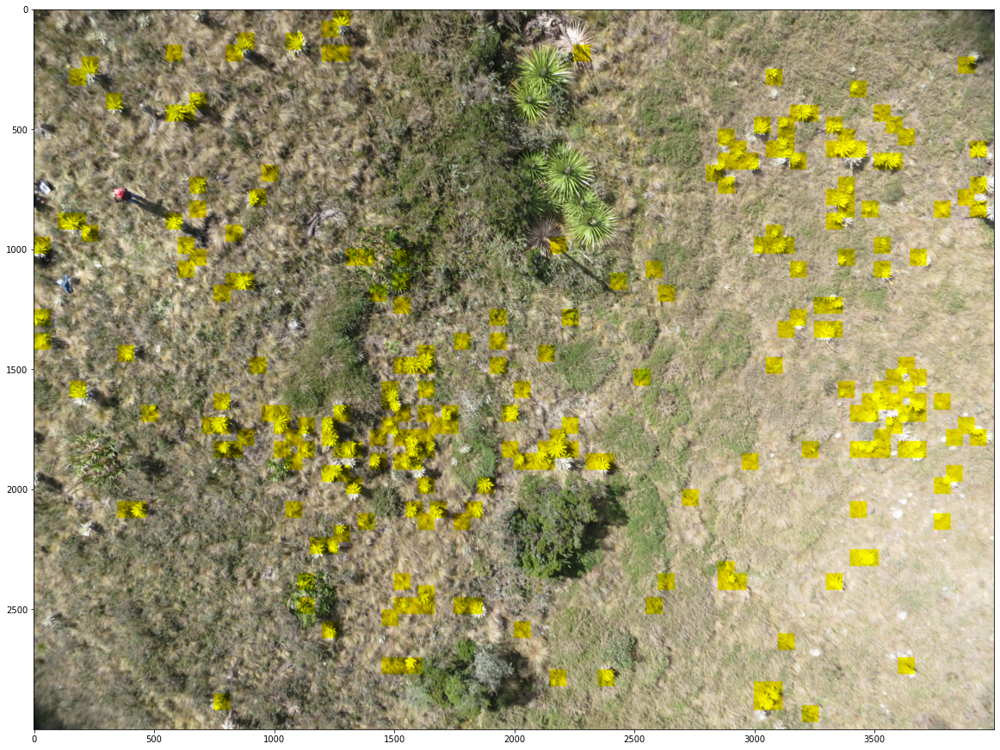

In [32]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model0.predict(subi2)
        Y_preds = model_T.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

### Pregunta 2.1

¿Qué puede observar sobre el desempeño de los diferentes modelos? Argumente cuál es el mejor modelo para poner en producción.

* Podemos ver que todos los modelos presentan desempeños muy buenos, claramente hay un salto notable al pasar de usar redes densamente conectadas a redes convolucionales, debido a su especialidad para trabajar con problemas de tratamiento de imagenes.

* Al trabajar con un enfoque de *Transfer Learning* se puede observar tambien un gran salto, pasando de una exactitud del 90% al 97% y con una menor cantidad de epocas.

* Cuando ya queremos hablar de poner en produccion un modelo, no solamente la Exactitud es la variable importante, la complejidad y estabilidad del modelo, la velocidad de ejecución y el peso del mismo para alojarlo en la nube son factores preponderantes en la toma de esta decision. Bajo esa premisa, el mejor modelo para colocar en produccion sería el modelo de redes neuronales con capas convolucionales ya que es un modelo sencillo, estable, con una capacidad de clasificacion, en este caso, superlativa y con un peso de menos de 3Mb, lo que lo hace muy manejable a nivel de API, con una velocidad de ejecución excelente y resultados bastante aceptables.

### Ejercicio 2.2

Investigue otra red pre-entrenada dsitinta a la VGG-16 e implemente el aprendizaje por transferencia para la deteccion de frailejones. Argumente por qué su justifica el aprendizaje por transferencia con base en el modelo pre-entrenado de su elección (cómo se relacionan la tarea base y la segunda tarea objetivo).

* Usaremos la red pre-entrenada Xception, que fue entrenada con el data set de ImageNet que contiene mas de 1,000,000 de imagenes de mas de 20,000 categorias (http://www.image-net.org) y se usará para este modelo de clasificacion de frailejones ya que en su arquitectura se usa una combinacion de los tres canales (RGB) bajo el siguiente principio:

- "las correlaciones espaciales y las que existen entre los canales son lo suficientemente libres para hacer que sea preferible no mapearlas juntas." (https://www.deeplearningitalia.com/guia-para-arquitecturas-de-redes-profundas/)

In [180]:
#load pre trained Xception model
model_Xcep_0   = applications.xception.Xception(weights='imagenet',include_top=False)
config_transI_Xcep = model_Xcep_0.get_config()

In [181]:
feat_X = model_Xcep_0.predict(X)
np.shape(feat_X)

(250, 2, 2, 2048)

In [182]:
#Summary of Xception Model
print(model_Xcep_0.summary())

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_19[0][0]                   
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [147]:
#inicializacion Normal
initnorm = keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=1)

model_Xcep = Sequential()  
model_Xcep.add(Flatten(input_shape=feat_X.shape[1:]))  
model_Xcep.add(Dense(5, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros'))  
model_Xcep.add(Dense(1, activation='sigmoid', kernel_initializer=initnorm, bias_initializer='zeros')) 

config_transF_Xcep = model_Xcep.get_config()

In [148]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["Exac_E", "Exac_V", "Exac_P", "Epoca"])

# Definimos el número máximo de iteraciones (épocas de la red)
epocas=500

# Definimos los parametros del Adam
adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)

# Inicializamos el error 
err_p = 999

for i in range(0,3,1):
    r = i^3
    CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
    CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)
       
    # Definimos la arquitectura de la red
    model_Xcep = Sequential.from_config(config_transF_Xcep)
    
    # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
    model_Xcep.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    
    # Ajustamos el modelo
    history=model_Xcep.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
    
    # Encontramos el mejor modelo en validación
    min_err=np.min(history.history['val_loss'])
    best_epoc=np.where(history.history['val_loss'] == min_err)[0] 
        
    # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
    model_Xcep.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)
            
    # Calculamos las metricas
    train_metrics = model_Xcep.evaluate(x=CE_x, y=CE_y, verbose=0)
    valid_metrics = model_Xcep.evaluate(x=CV_x, y=CV_y, verbose=0)
    test_metrics = model_Xcep.evaluate(x=CP_x, y=CP_y, verbose=0)
    
    # Guardamos las métricas de desempeño
    accu_e = train_metrics[1]
    loss_e = train_metrics[0]
    accu_v = valid_metrics[1]
    loss_v = valid_metrics[0]
    accu_p = test_metrics[1]
    loss_p = test_metrics[0]
    
    if (loss_p < err_p):
        pathr =('Transfer_Xcep_Adam_partseed='+str(r)+'.tf')
        model_Xcep.save(pathr) 
        err_p = loss_p
    
    # Imprimimos el desempeño para cada repetición
    print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))
    
    x.add_row([np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])

print(x)

INFO:tensorflow:Assets written to: Transfer_Xcep_Adam_partseed=3.tf\assets
Epoca= 254 , accu_v1=0.9189189076423645 , accu_v2=0.8421052694320679
Epoca= 87 , accu_v1=0.8918918967247009 , accu_v2=0.8684210777282715
INFO:tensorflow:Assets written to: Transfer_Xcep_Adam_partseed=1.tf\assets
Epoca= 176 , accu_v1=0.9189189076423645 , accu_v2=0.9473684430122375
+--------+--------+--------+-------+
| Exac_E | Exac_V | Exac_P | Epoca |
+--------+--------+--------+-------+
|  1.0   | 0.9189 | 0.8421 |  254  |
|  1.0   | 0.8919 | 0.8684 |   87  |
|  1.0   | 0.9189 | 0.9474 |  176  |
+--------+--------+--------+-------+


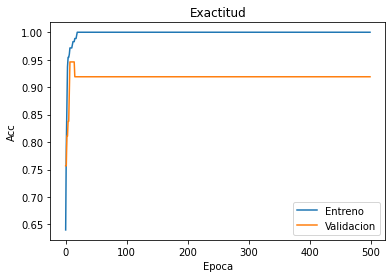

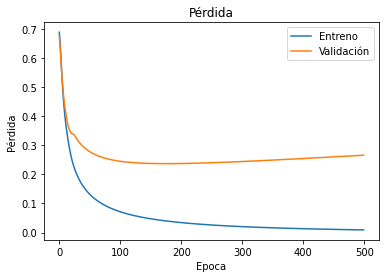

In [149]:
plt.figure(1)
plt.plot(history.history['accuracy'])  
plt.plot(history.history['val_accuracy'])  
plt.title('Exactitud')  
plt.ylabel('Acc')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validacion'], loc='lower right')
plt.show()

plt.figure(1) 
plt.plot(history.history['loss'])  
plt.plot(history.history['val_loss'])  
plt.title('Pérdida')  
plt.ylabel('Pérdida')  
plt.xlabel('Epoca')  
plt.legend(['Entreno', 'Validación'], loc='upper right')  
plt.show()

Probaremos parametros de aprendizaje diferentes

In [150]:
# Inicializamos la tabla donde guardamos los resultados
x = PrettyTable(["lr","b_1,", "b_2","Exac_E", "Exac_V", "Exac_P", "Epoca"])

l_rate = [0.1, 0.01, 0.001]
b_1 = [0.9,0.09,0.009]
b_2 = [0.9,0.09,0.009]

err_best = 999
epoch_best = 999

for lr in l_rate:
    epoch_best = 999
    for b_uno in b_1:
        epoch_best = 999
        for b_dos in b_2:
            epoch_best = 999
                        
            # Definimos el número máximo de iteraciones (épocas de la red)
            epocas=100

            opti = keras.optimizers.Adam(lr=lr, beta_1=b_uno, beta_2=b_dos)
    
            # Inicializamos el error 

            for i in range(0,3,1):
                r = i^3
                CE_x, CV0_x, CE_y, CV0_y = train_test_split(feat_X, Y.T, test_size = 0.3, random_state = r)
                CV_x, CP_x, CV_y, CP_y = train_test_split(CV0_x, CV0_y, test_size = 0.5, random_state = r)

                # Definimos la arquitectura de la red
                model_Xcep = Sequential.from_config(config_transF_Xcep)

                # Definimos el método de optimización con respecto a su funcion de perdida (además guardamos la exactitud para cada iteracion)
                model_Xcep.compile(loss='binary_crossentropy', optimizer=opti, metrics=['accuracy'])

                # Ajustamos el modelo
                history=model_Xcep.fit(x=CE_x, y=CE_y, epochs=epocas, validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

                # Encontramos el mejor modelo en validación
                min_err=np.min(history.history['val_loss'])
                best_epoc=np.where(history.history['val_loss'] == min_err)[0] 

                # Conseguimos el mejor modelo de acuerdo con su desempeño en validación
                model_Xcep.fit(x=CE_x, y=CE_y, epochs=best_epoc[0], validation_data=(CV_x, CV_y), verbose=0, shuffle=False)

                # Calculamos las metricas
                train_metrics = model_Xcep.evaluate(x=CE_x, y=CE_y, verbose=0)
                valid_metrics = model_Xcep.evaluate(x=CV_x, y=CV_y, verbose=0)
                test_metrics = model_Xcep.evaluate(x=CP_x, y=CP_y, verbose=0)

                # Guardamos las métricas de desempeño
                accu_e = train_metrics[1]
                loss_e = train_metrics[0]
                accu_v = valid_metrics[1]
                loss_v = valid_metrics[0]
                accu_p = test_metrics[1]
                loss_p = test_metrics[0]               
                
                if ((loss_p <= err_best)):
                    if (best_epoc[0] < epoch_best):
                        print("\nSe guarda el mejor modelo con ls = " + str(loss_p)+
                              " y Ep=" + str(best_epoc[0])+
                              ' lr='+str(lr)+
                              ' b1='+str(b_uno)+
                              ' b2='+str(b_dos)
                             )
                        pathr =('Tra_Adam_Xcep_lr='+str(lr)+
                                '_b1='+str(b_uno)+
                                '_b2='+str(b_dos)+
                                '_partseed='+str(r)+'.tf')
                        model_Xcep.save(pathr) 
                        err_best = loss_p
                        epoch_best = best_epoc[0]

                # Imprimimos el desempeño para cada repetición
                print('Epoca= '+str(best_epoc[0])+' , accu_v1='+str(accu_v) +' , accu_v2='+str(accu_p))

                x.add_row([lr,b1,b2,np.round(accu_e,4), np.round(accu_v,4), np.round(accu_p,4), best_epoc[0]])


Se guarda el mejor modelo con ls = 0.5875211358070374 y Ep=10 lr=0.1 b1=0.9 b2=0.9
INFO:tensorflow:Assets written to: Tra_Adam_Xcep_lr=0.1_b1=0.9_b2=0.9_partseed=3.tf\assets
Epoca= 10 , accu_v1=0.9459459185600281 , accu_v2=0.9210526347160339
Epoca= 20 , accu_v1=0.8648648858070374 , accu_v2=0.8684210777282715
Epoca= 12 , accu_v1=0.9729729890823364 , accu_v2=0.9210526347160339
Epoca= 1 , accu_v1=0.4324324429035187 , accu_v2=0.6052631735801697
Epoca= 99 , accu_v1=0.8648648858070374 , accu_v2=0.7631579041481018

Se guarda el mejor modelo con ls = 0.40408721566200256 y Ep=9 lr=0.1 b1=0.9 b2=0.09
INFO:tensorflow:Assets written to: Tra_Adam_Xcep_lr=0.1_b1=0.9_b2=0.09_partseed=1.tf\assets
Epoca= 9 , accu_v1=0.837837815284729 , accu_v2=0.8157894611358643
Epoca= 10 , accu_v1=0.8108108043670654 , accu_v2=0.7894737124443054
Epoca= 96 , accu_v1=0.837837815284729 , accu_v2=0.7105262875556946
Epoca= 15 , accu_v1=0.45945945382118225 , accu_v2=0.3947368562221527
Epoca= 99 , accu_v1=1.0 , accu_v2=0.947

In [151]:
print(x)

+-------+------+-----+--------+--------+--------+-------+
|   lr  | b_1, | b_2 | Exac_E | Exac_V | Exac_P | Epoca |
+-------+------+-----+--------+--------+--------+-------+
|  0.1  | 0.9  | 0.9 | 0.9943 | 0.9459 | 0.9211 |   10  |
|  0.1  | 0.9  | 0.9 |  1.0   | 0.8649 | 0.8684 |   20  |
|  0.1  | 0.9  | 0.9 |  1.0   | 0.973  | 0.9211 |   12  |
|  0.1  | 0.9  | 0.9 | 0.6057 | 0.4324 | 0.6053 |   1   |
|  0.1  | 0.9  | 0.9 | 0.8457 | 0.8649 | 0.7632 |   99  |
|  0.1  | 0.9  | 0.9 | 0.8857 | 0.8378 | 0.8158 |   9   |
|  0.1  | 0.9  | 0.9 | 0.7657 | 0.8108 | 0.7895 |   10  |
|  0.1  | 0.9  | 0.9 | 0.8229 | 0.8378 | 0.7105 |   96  |
|  0.1  | 0.9  | 0.9 | 0.4343 | 0.4595 | 0.3947 |   15  |
|  0.1  | 0.9  | 0.9 | 0.9943 |  1.0   | 0.9474 |   99  |
|  0.1  | 0.9  | 0.9 | 0.9943 | 0.9189 | 0.8947 |   49  |
|  0.1  | 0.9  | 0.9 |  1.0   | 0.973  | 0.8947 |   27  |
|  0.1  | 0.9  | 0.9 |  1.0   | 0.973  | 0.9474 |   7   |
|  0.1  | 0.9  | 0.9 |  1.0   | 0.8919 | 0.9211 |   5   |
|  0.1  | 0.9 

In [152]:
print(x[18])

+-----+------+-----+--------+--------+--------+-------+
|  lr | b_1, | b_2 | Exac_E | Exac_V | Exac_P | Epoca |
+-----+------+-----+--------+--------+--------+-------+
| 0.1 | 0.9  | 0.9 |  1.0   | 0.9459 | 0.9737 |   9   |
+-----+------+-----+--------+--------+--------+-------+


Podemos observar que esta red presenta niveles de exactitud iguales que la red VGG-19 pero con menos epocas, lo que nos llevaria a quedarnos con este modelo usando esta red pre-entrenada.

### Ejercicio 2.3
Construya un algoritmo que utilice el mejor modelo de red neuronal para la detección de poblaciones en la imagen completa IMG_3451.JPG, y estime la densidad para cada población detectada.

*Ayuda:* Mediante un procedimiento sencillo, primero detecte las poblaciones de frailejones y luego estime su densidad, calculada como el numero de frailejones por area poblada.

In [153]:
model_final = load_model('Tra_Adam_Xcep_lr=0.1_b1=0.9_b2=0.9_partseed=3.tf')

print(model_final.summary())

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_11 (Flatten)         (None, 8192)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 5)                 40965     
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 6         
Total params: 40,971
Trainable params: 40,971
Non-trainable params: 0
_________________________________________________________________
None


In [154]:
Y_pred = model_final.predict(feat_X)
Y_preds = (Y_pred > 0.5)

confusion_matrix(Y.T, Y_preds)

array([[143,   2],
       [  4, 101]], dtype=int64)

In [159]:
np.shape(Y_preds)

(250, 1)

In [160]:
np.shape(X)

(250, 70, 70, 3)

In [173]:
np.shape(X[0][0])

(70, 3)

In [176]:
np.shape(Y_preds)

(250, 1)

In [177]:
import keras
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
# load the image
img = load_img('IMG_3451.jpg')
print(type(img))
# convert to numpy array
img_array = img_to_array(img)
print(img_array.dtype)
print(img_array.shape)
# convert back to image
img_pil = array_to_img(img_array)
print(type(img))

<class 'PIL.JpegImagePlugin.JpegImageFile'>
float32
(3000, 4000, 3)
<class 'PIL.JpegImagePlugin.JpegImageFile'>


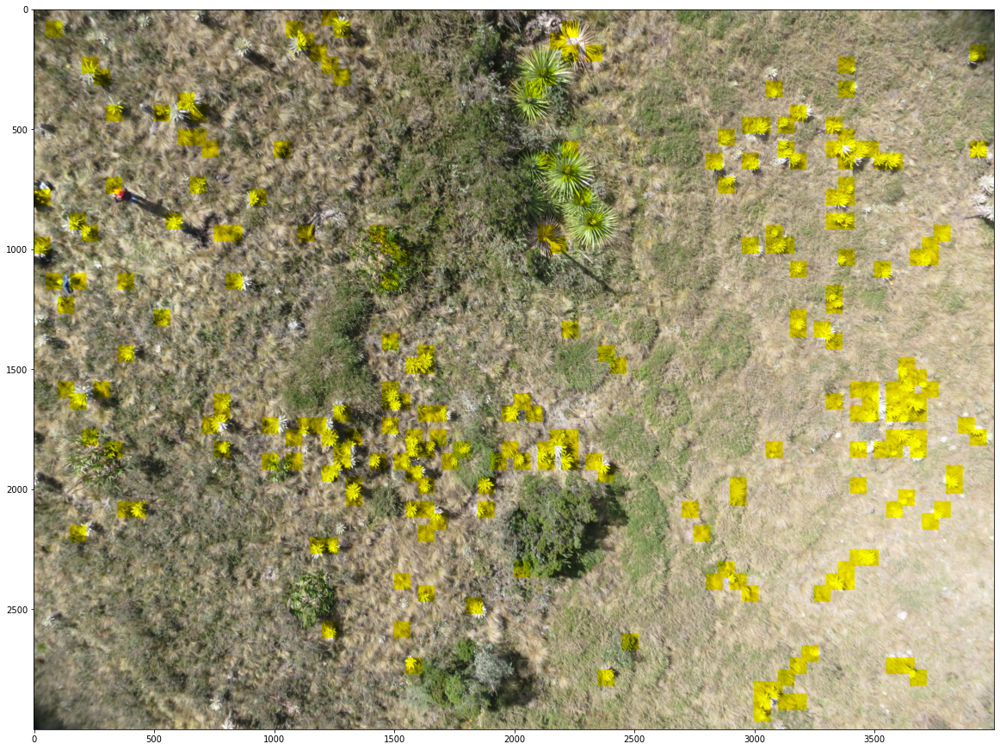

In [208]:
# Lo pasamos por nuestra imagen de prueba
x = np.array(img)
x2 = x

f_count=0

ni = x.shape[0]-50
mi = x.shape[1]-50

f1=0
f2=70
for i in range(1,ni,50):
    c1=0
    c2=70
    for j in range(1,mi,50):
        subi=x[f1:f2,c1:c2,]/255.
        subi2=np.expand_dims(subi,0)
        feat_subi2 = model_Xcep_0.predict(subi2)
        Y_preds = model_final.predict(feat_subi2)
        pred_P = (Y_preds > 0.5)
        if(pred_P==1):
            x2[f1:f2,c1:c2,2]=0
            f_count=f_count+1
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50
        
plt.figure(figsize = (20,20))
plt.imshow(x2)

In [211]:
print("El numero de Frailejones es: "+str(f_count))

El numero de Frailejones es: 239


In [213]:
x2[f1:f2,c1:c2,2]

array([[55, 64, 69, ..., 52, 57, 57],
       [51, 56, 64, ..., 50, 55, 57],
       [53, 52, 58, ..., 41, 46, 52],
       ...,
       [29, 23, 24, ...,  0,  0,  0],
       [27, 25, 27, ...,  0,  0,  0],
       [34, 34, 32, ...,  0,  0,  0]], dtype=uint8)

In [368]:
num_f=0

ni = x2.shape[0]-50
mi = x2.shape[1]-50

matrix = np.empty(shape=(50,50),dtype='int') 

f1=0
f2=70
for i, a in zip(range(1,ni,50),range(0,50)):
    c1=0
    c2=70
    for j, b in zip(range(1,mi,50),range(0,50)):
        if(x2[f1:f2,c1:c2,2].any()==0):
            matrix[a][b]=1
        else:
            matrix[a][b]=0
        c1=c1+50
        c2=c2+50
    f1=f1+50
    f2=f2+50

In [471]:
matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [480]:
# Program to count islands in boolean 2D matrix 
class Graph: 

	def __init__(self, row, col, g): 
		self.ROW = row 
		self.COL = col 
		self.graph = g 

	# A function to check if a given cell 
	# (row, col) can be included in DFS 
	def isSafe(self, i, j, visited): 
		# row number is in range, column number 
		# is in range and value is 1 
		# and not yet visited 
		return (i >= 0 and i < self.ROW and
				j >= 0 and j < self.COL and
				not visited[i][j] and self.graph[i][j]) 
			

	# A utility function to do DFS for a 2D 
	# boolean matrix. It only considers 
	# the 8 neighbours as adjacent vertices 
	def DFS(self, i, j, visited): 

		# These arrays are used to get row and 
		# column numbers of 8 neighbours 
		# of a given cell 
		rowNbr = [-1, -1, -1, 0, 0, 1, 1, 1]; 
		colNbr = [-1, 0, 1, -1, 1, -1, 0, 1]; 
		
		# Mark this cell as visited 
		visited[i][j] = True

		# Recur for all connected neighbours 
		for k in range(8): 
			if self.isSafe(i + rowNbr[k], j + colNbr[k], visited): 
				self.DFS(i + rowNbr[k], j + colNbr[k], visited) 


	# The main function that returns 
	# count of islands in a given boolean 
	# 2D matrix 
	def countIslands(self): 
		# Make a bool array to mark visited cells. 
		# Initially all cells are unvisited 
		visited = [[False for j in range(self.COL)]for i in range(self.ROW)] 

		# Initialize count as 0 and travese 
		# through the all cells of 
		# given matrix 
		count = 0
		for i in range(self.ROW): 
			for j in range(self.COL): 
				# If a cell with value 1 is not visited yet, 
				# then new island found 
				if visited[i][j] == False and self.graph[i][j] == 1: 
					# Visit all cells in this island 
					# and increment island count 
					self.DFS(i, j, visited) 
					count += 1

		return count 


#row = len(matrix) 
#col = len(matrix[0])

In [482]:
g = Graph(len(matrix) ,len(matrix[0]) , matrix) 

print ("Number of islands is:")
print (g.countIslands())

Number of islands is:
72


In [427]:
np.shape(x[0:70,0:70,]/255)

(70, 70, 3)

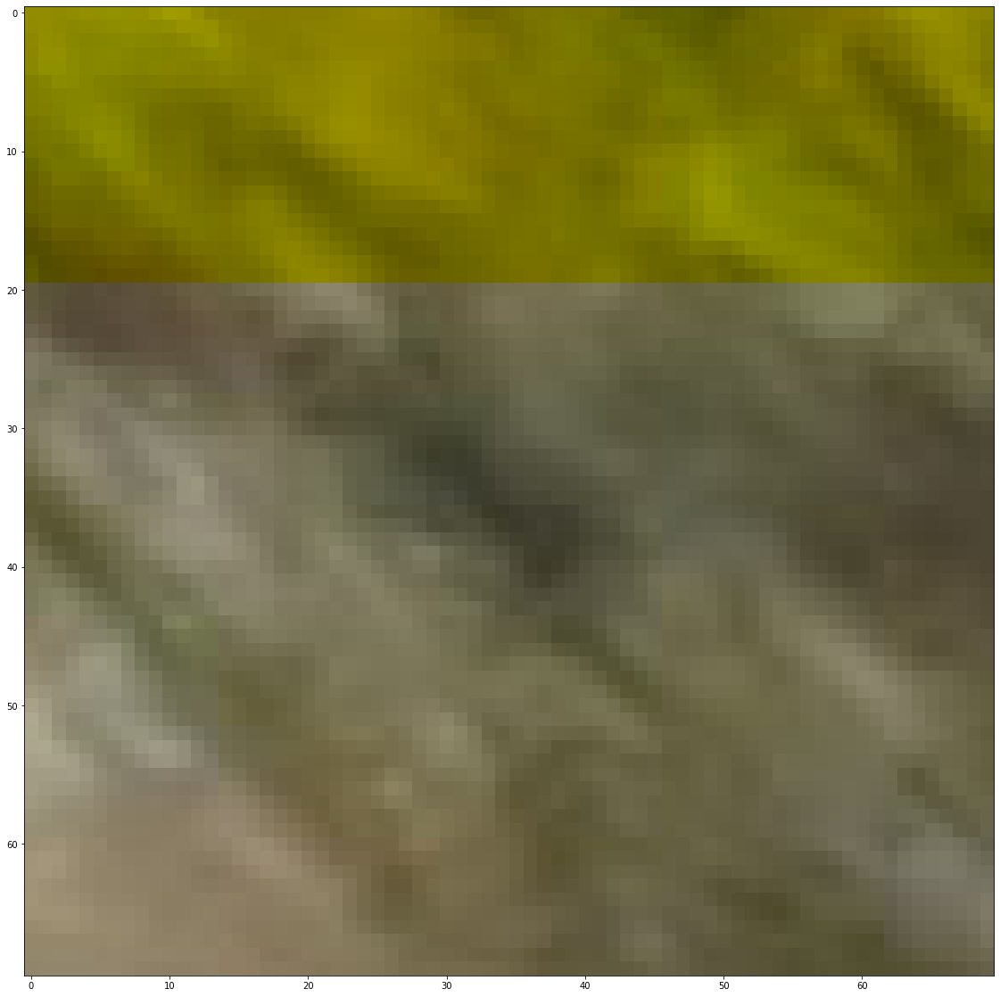

In [262]:
plt.figure(figsize = (20,20))
plt.imshow(x[0+100:70+100,0+50:70+50,])

In [250]:
x[0+0:70+0,0+50:70+50,2].any()==0

False